In [2]:
from ultralytics import YOLO
import os
import numpy as np
import math
import pandas as pd
from scipy.signal import find_peaks
from scipy.spatial import KDTree
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.image as mpimg
import matplotlib.patches as patches
from shapely.ops import unary_union
import cv2

In [3]:
# Загрузка модели YOLO
model = YOLO('bestY8.pt')  

# Папка с изображениями
images_folder = 'camera52HD/'  
allowed_ext = ('.jpg', '.jpeg', '.png')

# Цвета для классов (если у вас есть несколько классов, подставьте нужные цвета)
class_colors = {
    0: (0, 255, 0),    # Класс 0 — зелёный
    1: (255, 0, 0),    # Класс 1 — синий
    2: (0, 0, 255),    # Класс 2 — красный
}

# Список изображений
image_files = sorted(
    [f for f in os.listdir(images_folder) if f.lower().endswith(tuple(allowed_ext))]
)

# Список для хранения данных распознавания
data = []

# Обрабатываем изображения
for filename in image_files:
    image_path = os.path.join(images_folder, filename)
    img = cv2.imread(image_path)

    if img is None:
        print(f"Ошибка загрузки изображения: {filename}")
        continue

    print(f"\n📷 Обрабатываем: {filename}")

    # Получаем результаты распознавания
    result = model(img)[0]

    # Обработка каждого найденного объекта
    for box in result.boxes:
        cls_id = int(box.cls.item())  # ID класса
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Координаты рамки
        label = model.names[cls_id]  # Название класса
        conf = float(box.conf.item())  # Уверенность
        text = f"{label}: {conf:.2f}"

        # Вычисление центра рамки
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        center = (center_x, center_y)

        # Добавляем данные в список
        data.append({
            'filename': filename,
            'class_id': cls_id,
            'x1': x1,
            'y1': y1,
            'x2': x2,
            'y2': y2,
            'center': center
        })

        # Цвет рамки
        color = class_colors.get(cls_id, (255, 255, 255))

        # Рисуем рамку и подписываем класс на изображении
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        cv2.putText(img, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Отображаем изображение в отдельном окне
    cv2.imshow(f"Обнаруженные объекты на {filename}", img)

    # Ожидаем, пока пользователь не закроет окно
    cv2.waitKey(0)  # Ожидаем нажатие клавиши

# Закрытие всех окон после завершения обработки
cv2.destroyAllWindows()

# Создаем DataFrame
df = pd.DataFrame(data)


📷 Обрабатываем: camera52HD_5-12-2023-1500-00000_jpg.rf.578c81672d62ea4da1433980bf659bbd.jpg

0: 384x640 18 persons, 12 trolleys, 146.3ms
Speed: 5.4ms preprocess, 146.3ms inference, 11.2ms postprocess per image at shape (1, 3, 384, 640)

📷 Обрабатываем: camera52HD_5-12-2023-1500-00001_jpg.rf.390282565a00f435c70e3e1892faa0f2.jpg

0: 384x640 18 persons, 11 trolleys, 87.9ms
Speed: 2.1ms preprocess, 87.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

📷 Обрабатываем: camera52HD_5-12-2023-1500-00002_jpg.rf.d8196a30ae7add0066c6386fca4490db.jpg

0: 384x640 20 persons, 11 trolleys, 86.3ms
Speed: 1.5ms preprocess, 86.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

📷 Обрабатываем: camera52HD_5-12-2023-1500-00003_jpg.rf.b570032505bc104d72e530695849f5fb.jpg

0: 384x640 18 persons, 11 trolleys, 91.8ms
Speed: 1.2ms preprocess, 91.8ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

📷 Обрабатываем: camera52HD_5-12-2023-1500-00004_jpg.rf.b0468

In [4]:
def rect_to_polygon(row):
    x1, y1, x2, y2 = row['x1'], row['y1'], row['x2'], row['y2']
    # Углы прямоугольника по часовой стрелке
    return Polygon([
        (x1, y1),
        (x2, y1),
        (x2, y2),
        (x1, y2)
    ])

# Применяем к каждой строке
df['geometry'] = df.apply(rect_to_polygon, axis=1)

# Преобразуем в GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')
gdf['square'] = gdf.geometry.area
print(gdf)

                                              filename  class_id   x1   y1  \
0    camera52HD_5-12-2023-1500-00000_jpg.rf.578c816...         1  623  337   
1    camera52HD_5-12-2023-1500-00000_jpg.rf.578c816...         1  579  620   
2    camera52HD_5-12-2023-1500-00000_jpg.rf.578c816...         2  676  530   
3    camera52HD_5-12-2023-1500-00000_jpg.rf.578c816...         2    1  541   
4    camera52HD_5-12-2023-1500-00000_jpg.rf.578c816...         1  672  395   
..                                                 ...       ...  ...  ...   
361  camera52HD_5-12-2023-1500-00015_jpg.rf.b3a6011...         1  866   54   
362  camera52HD_5-12-2023-1500-00015_jpg.rf.b3a6011...         2  699  364   
363  camera52HD_5-12-2023-1500-00015_jpg.rf.b3a6011...         1  707  140   
364  camera52HD_5-12-2023-1500-00015_jpg.rf.b3a6011...         1  830   50   
365  camera52HD_5-12-2023-1500-00015_jpg.rf.b3a6011...         2  689  180   

      x2   y2          center  \
0    687  547  (655.0, 442.0) 

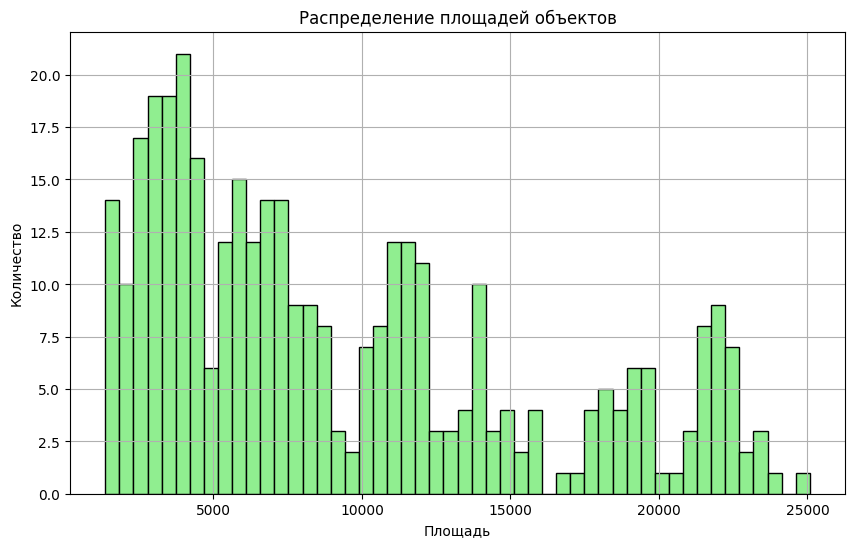

In [5]:
plt.figure(figsize=(10, 6))
plt.hist(gdf.square, bins=50, color='lightgreen', edgecolor='black')
plt.title("Распределение площадей объектов")
plt.xlabel("Площадь")
plt.ylabel("Количество")
plt.grid(True)
plt.show()

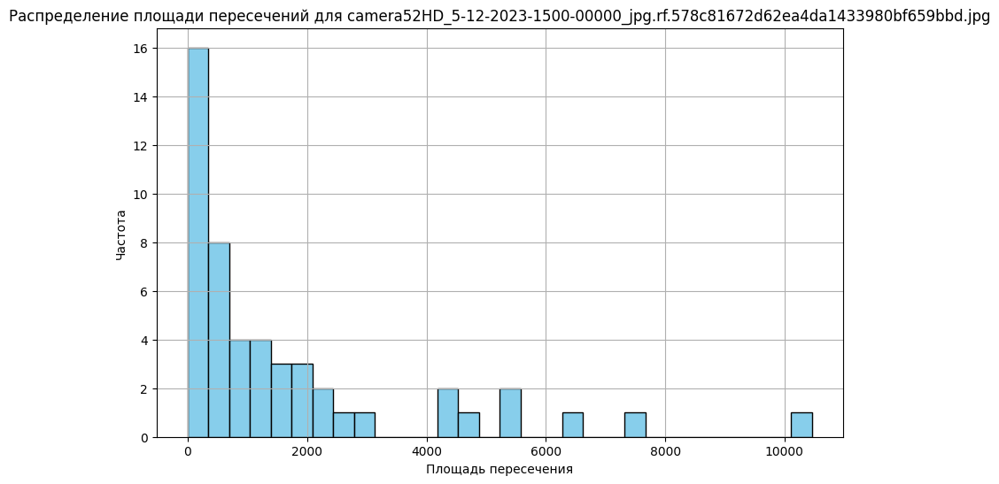

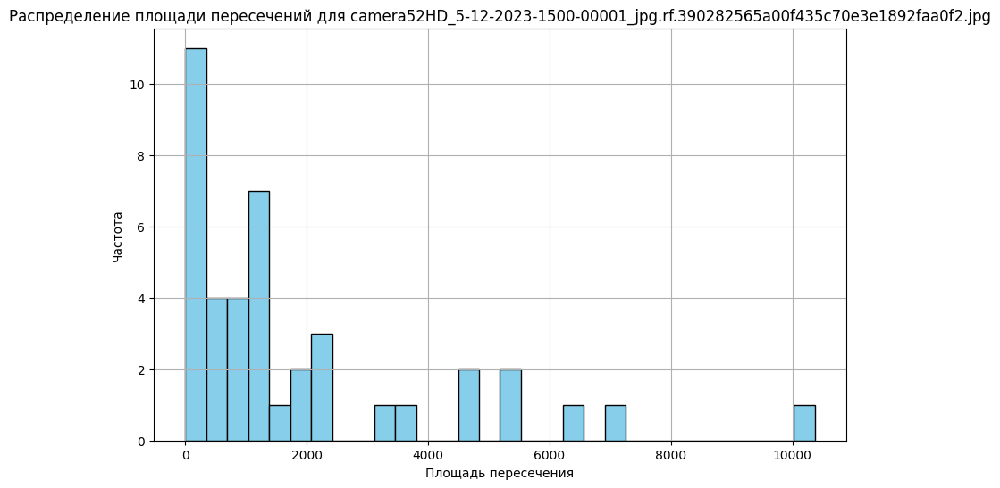

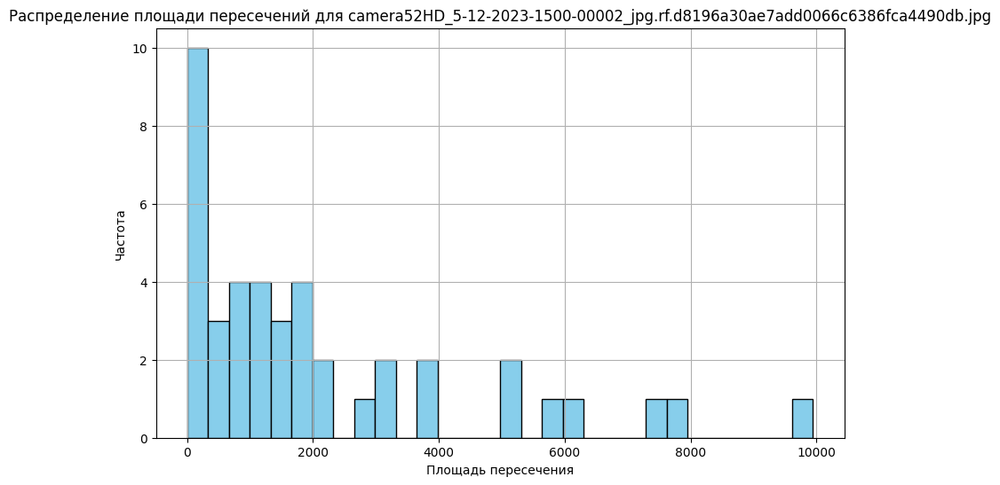

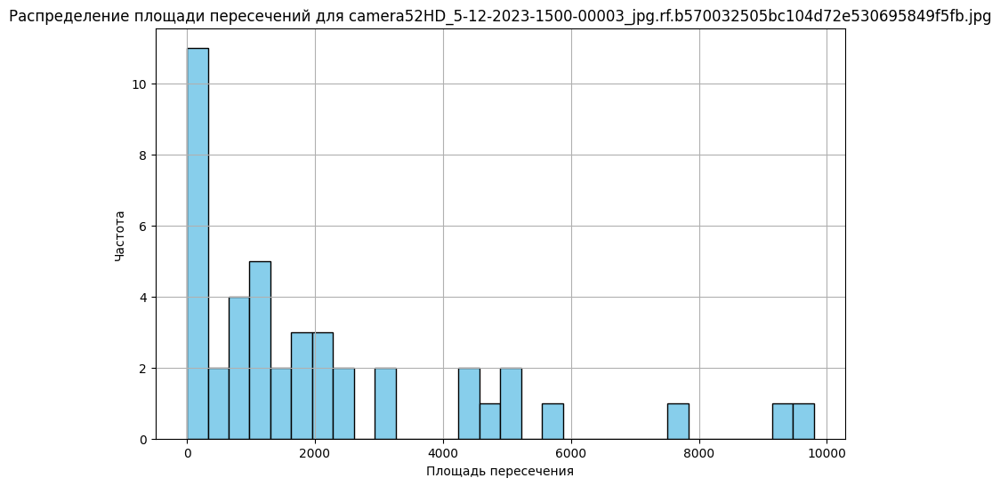

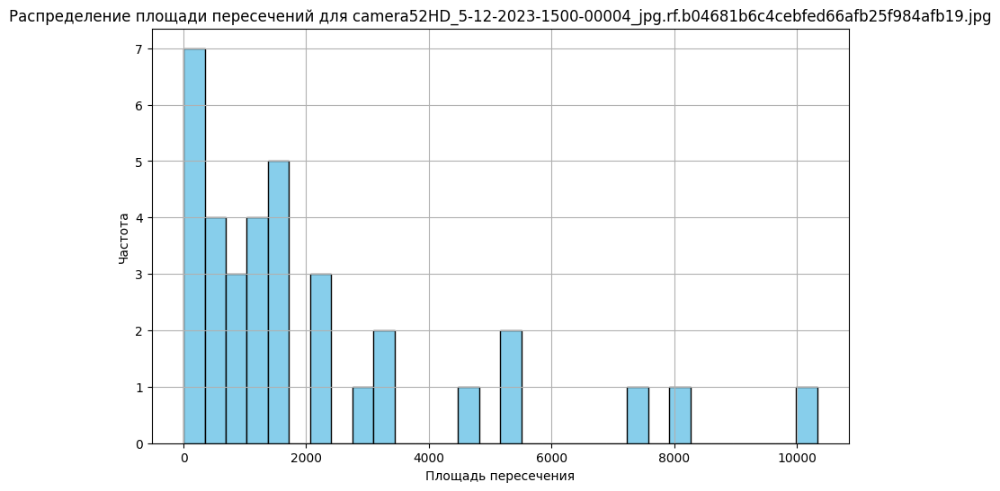

...

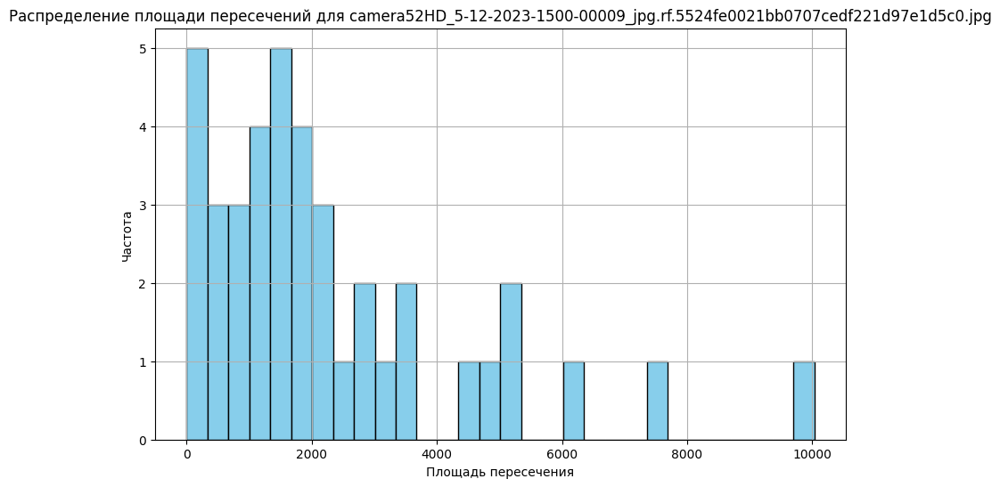

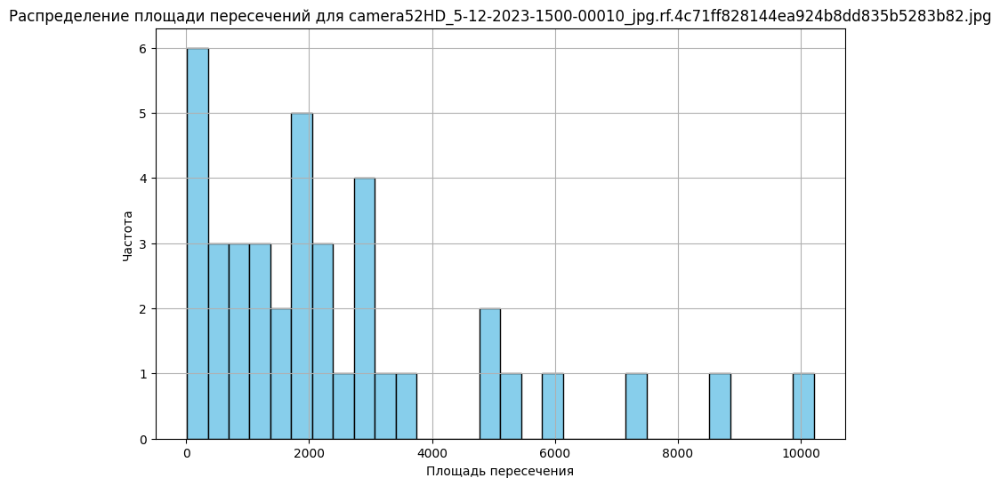

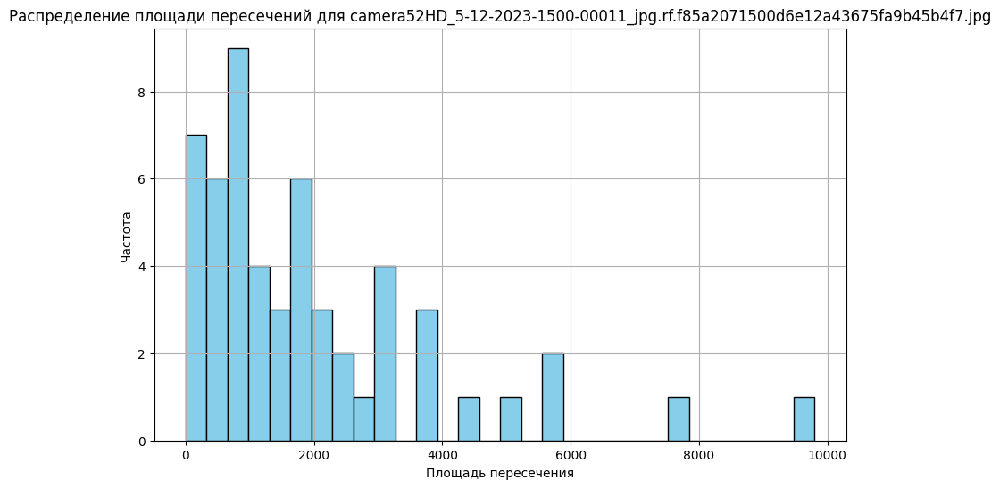

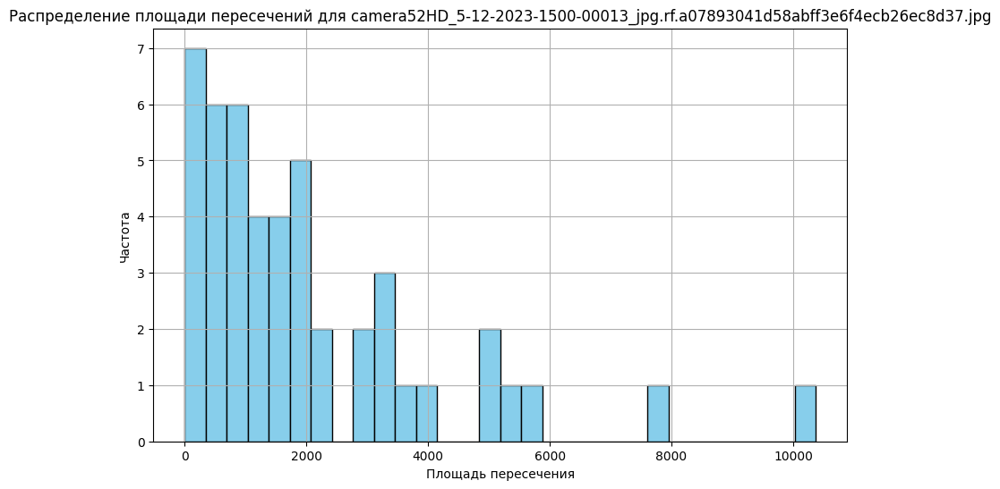

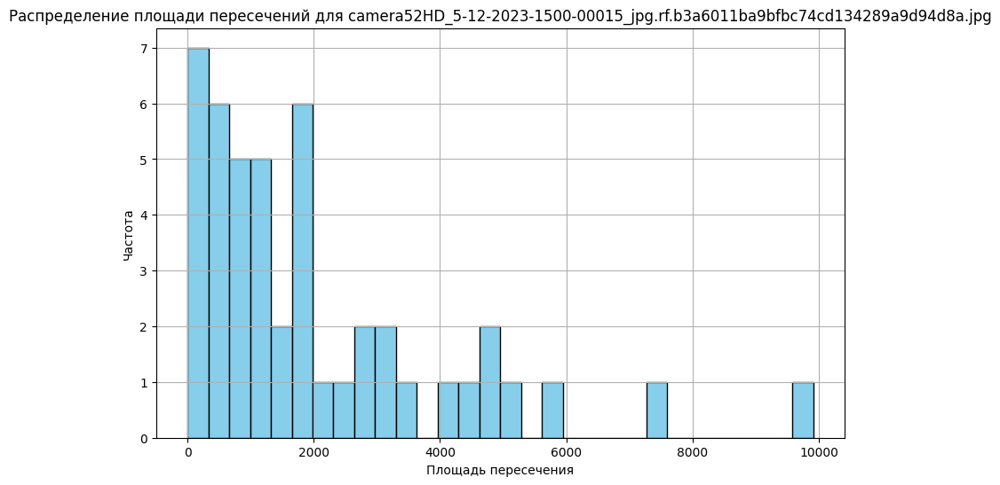

In [6]:
# Группируем по filename
grouped = df.groupby('filename')

# Для каждого filename создаем отдельную гистограмму
for filename, group in grouped:
    # Список для хранения площадей пересечений
    intersection_areas = []
    
    # Проходим по всем объектам в группе и проверяем пересечения
    for i, row1 in group.iterrows():
        for j, row2 in group.iterrows():
            if i < j:  # Проверяем только одну пару (избегаем повторных проверок)
                if row1['geometry'].intersects(row2['geometry']):
                    # Вычисляем площадь пересечения и добавляем в список
                    intersection_area = row1['geometry'].intersection(row2['geometry']).area
                    intersection_areas.append(intersection_area)
    
    # Строим гистограмму для каждого filename
    plt.figure(figsize=(10, 6))
    plt.hist(intersection_areas, bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Распределение площади пересечений для {filename}')
    plt.xlabel('Площадь пересечения')
    plt.ylabel('Частота')
    plt.grid(True)
    plt.show()

In [7]:
# Предположим, что intersection_areas — это список всех пересечений
hist_vals, bin_edges = np.histogram(gdf.square, bins=50)

# Находим пики на гистограмме
peaks, _ = find_peaks(hist_vals, prominence=2)

# Середины корзин (bin centers)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Ширина окна вокруг пика (в единицах площади пересечения)
delta = 1800

# Сохраняем результаты
for peak_idx in peaks:
    peak_center = bin_centers[peak_idx]
    
    # Выбираем значения в пределах ±delta от пика
    area_window = [area for area in gdf.square if abs(area - peak_center) <= delta]
    
    if area_window:
        mean = np.mean(area_window)
        std = np.std(area_window)
        print(f"📌 Пик на ~{peak_center:.0f} → Среднее: {mean:.1f}, Ст. отклонение: {std:.1f}, Кол-во: {len(area_window)}")

📌 Пик на ~3969 → Среднее: 3742.2, Ст. отклонение: 933.3, Кол-во: 115
📌 Пик на ~5867 → Среднее: 5858.3, Ст. отклонение: 1066.9, Кол-во: 97
📌 Пик на ~6816 → Среднее: 6722.5, Ст. отклонение: 953.6, Кол-во: 87
📌 Пик на ~11085 → Среднее: 11225.6, Ст. отклонение: 742.5, Кол-во: 56
📌 Пик на ~13932 → Среднее: 13872.7, Ст. отклонение: 951.5, Кол-во: 33
📌 Пик на ~15829 → Среднее: 15312.7, Ст. отклонение: 1047.4, Кол-во: 18
📌 Пик на ~19150 → Среднее: 18969.7, Ст. отклонение: 833.4, Кол-во: 28
📌 Пик на ~21996 → Среднее: 22114.1, Ст. отклонение: 726.4, Кол-во: 34


In [8]:
def group_objects(gdf):
    gdf = gdf.copy()  # Создаем копию DataFrame, чтобы не изменять исходный
    gdf['group'] = np.nan  # Столбец для хранения групп
    group_id = 1  # Начинаем с первой группы

    # 1. Распределяем объекты 0 и 2 по отдельным группам
    for idx, row in gdf[gdf['class_id'].isin([0, 2])].iterrows():
        gdf.loc[idx, 'group'] = group_id
        group_id += 1

    # 2. Обрабатываем объекты класса 1
    for idx, row in gdf[gdf['class_id'] == 1].iterrows():
        current_geom = row['geometry']
        current_center = row['center']
        best_group = None
        max_intersection_area = 0

        # Ищем пересечения с объектами классов 0 и 2
        for idx2, row2 in gdf[gdf['class_id'].isin([0, 2])].iterrows():
            compare_geom = row2['geometry']
            intersection_area = current_geom.intersection(compare_geom).area

            if intersection_area > max_intersection_area:
                max_intersection_area = intersection_area
                best_group = row2['group']

        # Если объект класса 1 пересекается с объектами класса 0 или 2, добавляем в группу с наибольшим пересечением
        if best_group is not None:
            gdf.loc[idx, 'group'] = best_group
        else:
            # Если объект 1 не пересекается, создаём для него новую группу
            gdf.loc[idx, 'group'] = group_id
            group_id += 1

    return gdf


def get_group_geometries(gdf):
    # Удаляем группы, в которых нет ни одного объекта класса 1
    valid_groups = (
        gdf.dropna(subset=['group'])
           .groupby(['filename', 'group'])
           .filter(lambda x: (x['class_id'] == 1).any())
    )

    # Объединяем геометрии оставшихся групп
    grouped = valid_groups.groupby(['filename', 'group'])['geometry'] \
                          .apply(unary_union).reset_index()
    
    grouped_gdf = gpd.GeoDataFrame(grouped, geometry='geometry')

    # Заменяем на прямоугольники-рамки (envelope)
    grouped_gdf['geometry'] = grouped_gdf['geometry'].apply(lambda g: g.envelope)

    return grouped_gdf

# Визуализация групп на изображениях
def show_groups_on_images(grouped_gdf, image_folder):
    for filename in grouped_gdf['filename'].unique():
        image_path = os.path.join(image_folder, filename)
        if not os.path.exists(image_path):
            print(f"[!] Image not found: {image_path}")
            continue

        print(f"[✓] Showing image: {filename}")
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        fig, ax = plt.subplots(figsize=(10, 10))
        ax.imshow(image_rgb)

        file_groups = grouped_gdf[grouped_gdf['filename'] == filename]

        for _, row in file_groups.iterrows():
            geometry = row['geometry']
            group_id = int(row['group'])

            if geometry.geom_type == 'Polygon':
                x, y = geometry.exterior.xy
                ax.plot(x, y, linewidth=2, color='red')
                # Подпись группы
                ax.text(x[0], y[0] - 10, f"Group {group_id}", color='yellow',
                        fontsize=12, bbox=dict(facecolor='black', alpha=0.5))

        ax.set_title(f"Groups on {filename}")
        ax.axis('off')
        plt.tight_layout()
        plt.show()

[✓] Showing image: camera52HD_5-12-2023-1500-00000_jpg.rf.578c81672d62ea4da1433980bf659bbd.jpg


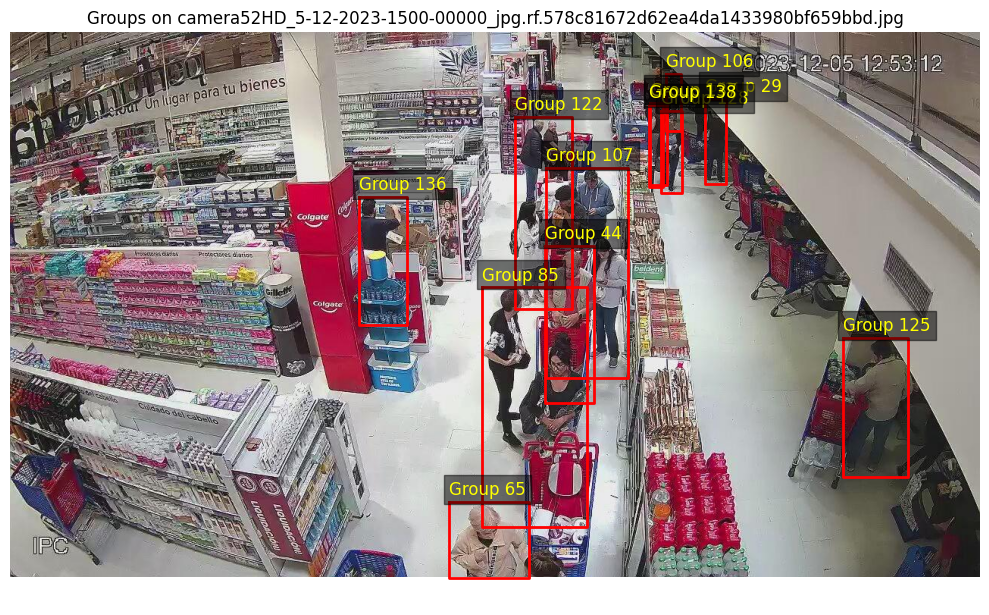

[✓] Showing image: camera52HD_5-12-2023-1500-00001_jpg.rf.390282565a00f435c70e3e1892faa0f2.jpg


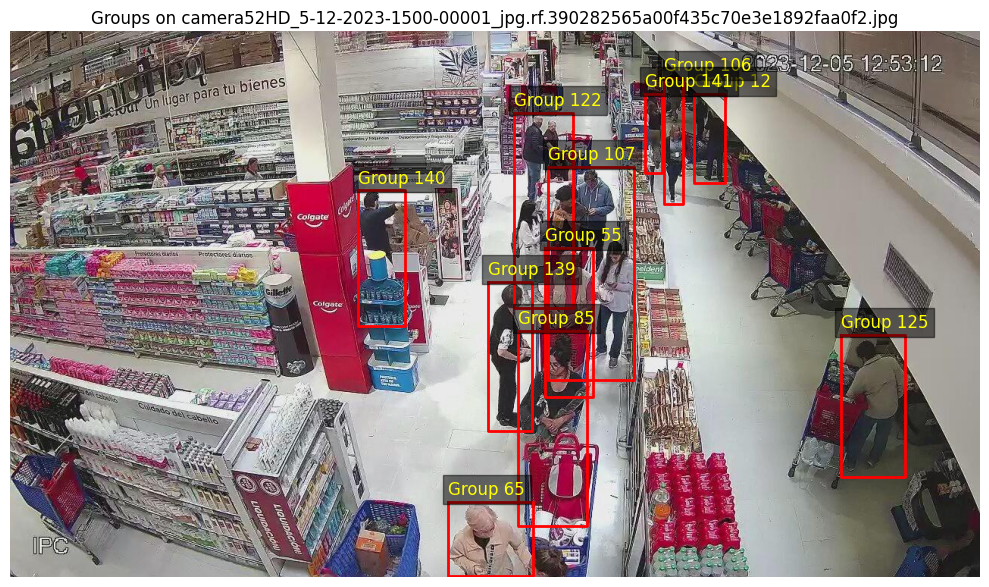

[✓] Showing image: camera52HD_5-12-2023-1500-00002_jpg.rf.d8196a30ae7add0066c6386fca4490db.jpg


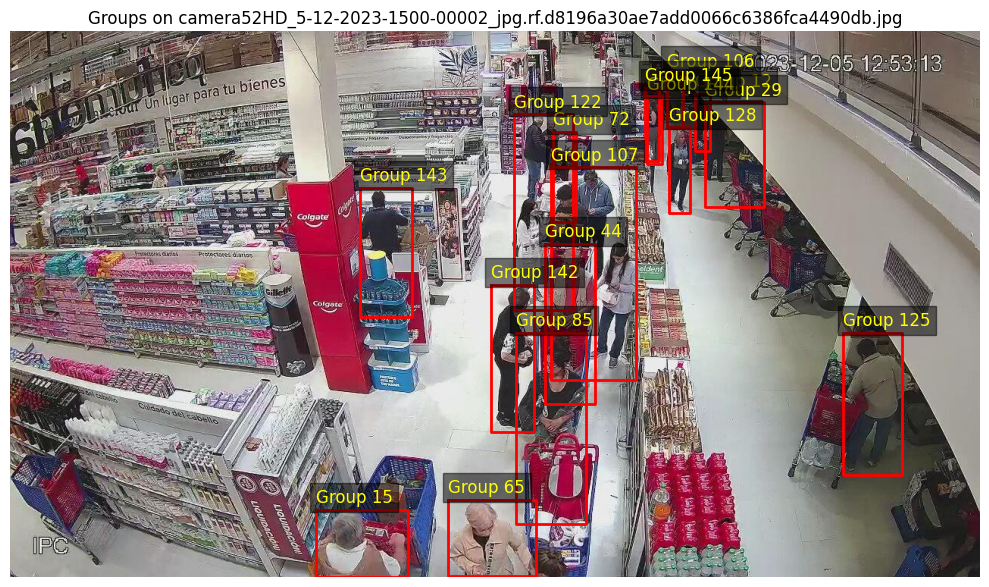

[✓] Showing image: camera52HD_5-12-2023-1500-00003_jpg.rf.b570032505bc104d72e530695849f5fb.jpg


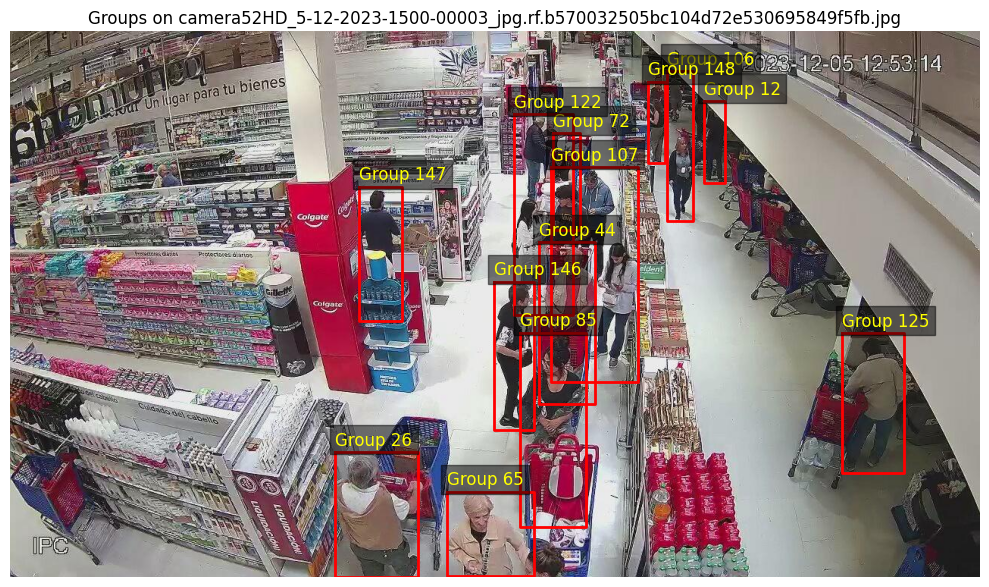

[✓] Showing image: camera52HD_5-12-2023-1500-00004_jpg.rf.b04681b6c4cebfed66afb25f984afb19.jpg


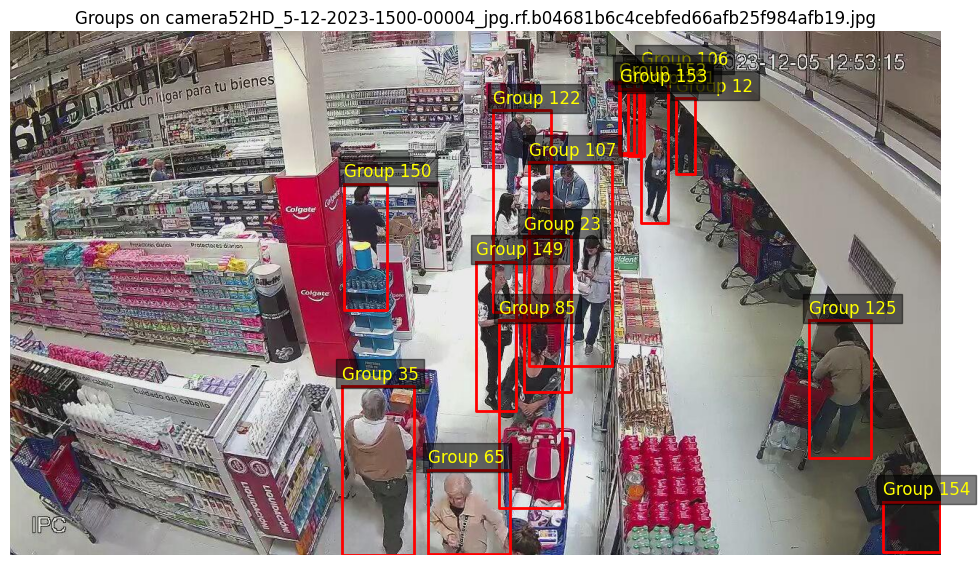

[✓] Showing image: camera52HD_5-12-2023-1500-00006_jpg.rf.b33a735b55b3f8bab9dce4a2287645dd.jpg


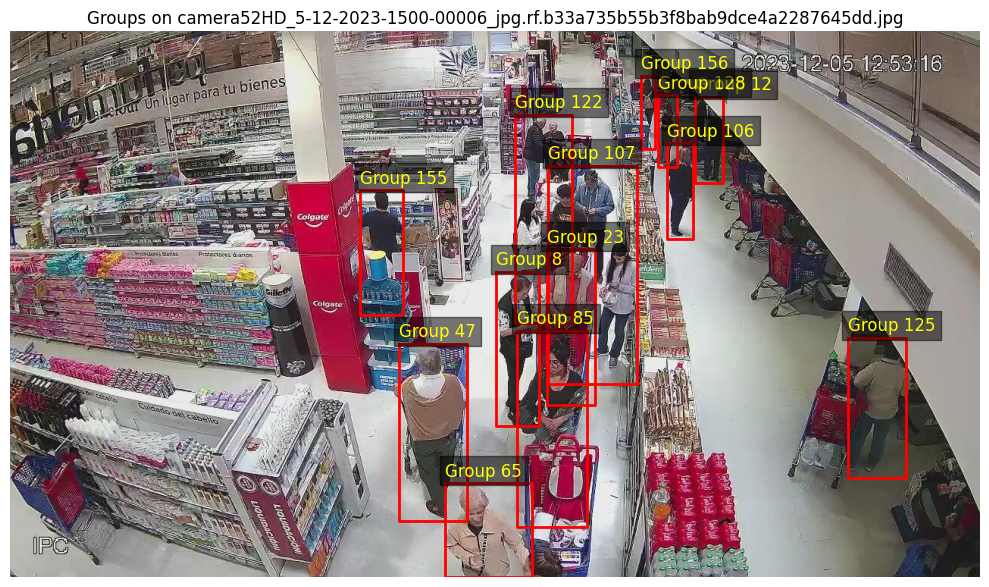

[✓] Showing image: camera52HD_5-12-2023-1500-00007_jpg.rf.7f582f1ba925e0b7e791bf8bbc23e3be.jpg


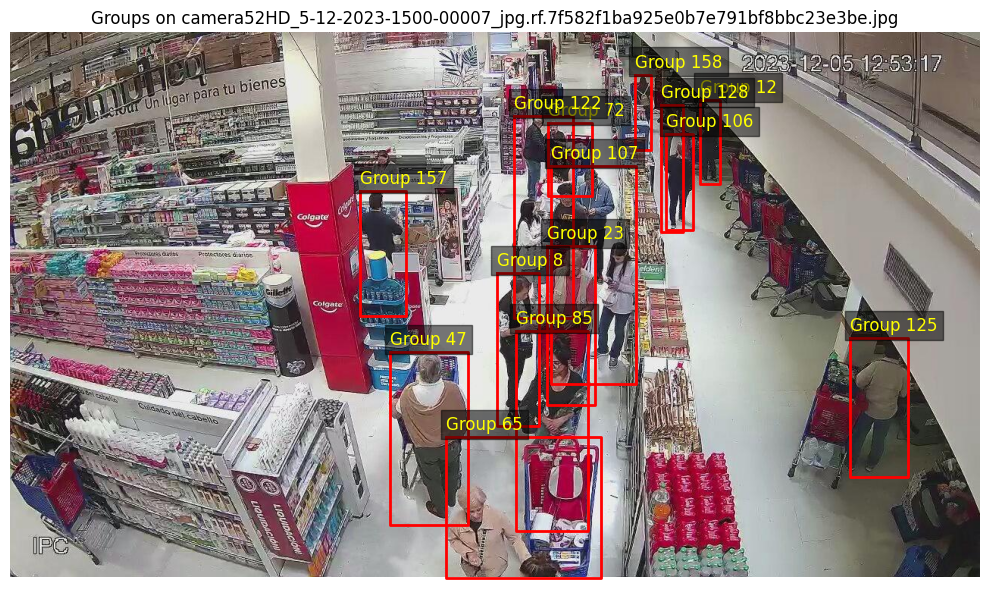

[✓] Showing image: camera52HD_5-12-2023-1500-00009_jpg.rf.5524fe0021bb0707cedf221d97e1d5c0.jpg


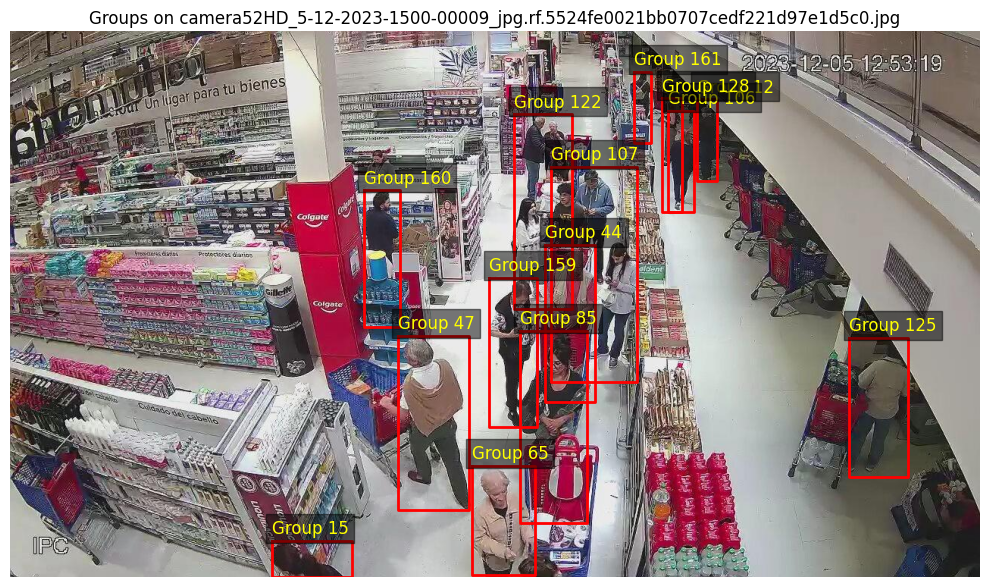

[✓] Showing image: camera52HD_5-12-2023-1500-00010_jpg.rf.4c71ff828144ea924b8dd835b5283b82.jpg


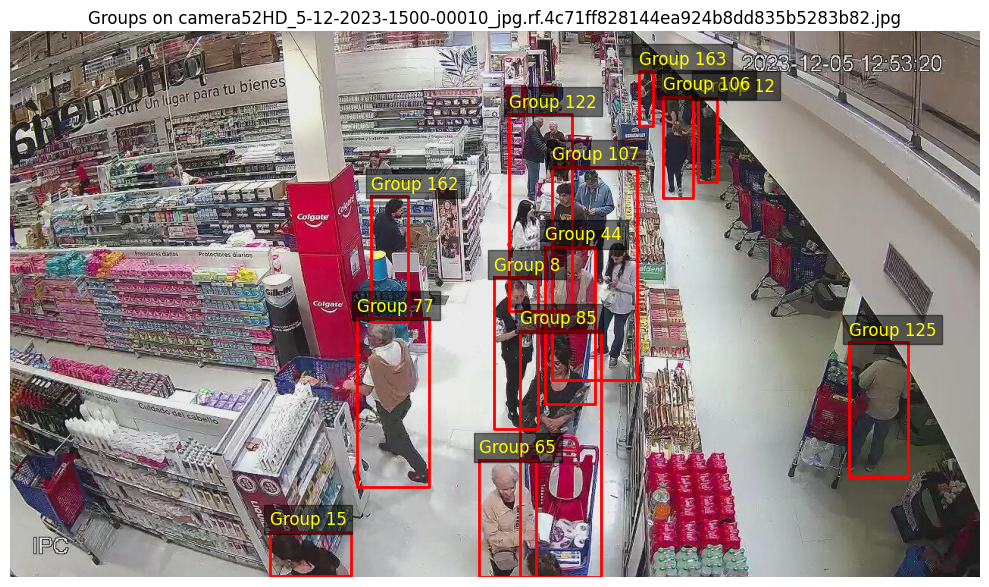

[✓] Showing image: camera52HD_5-12-2023-1500-00011_jpg.rf.f85a2071500d6e12a43675fa9b45b4f7.jpg


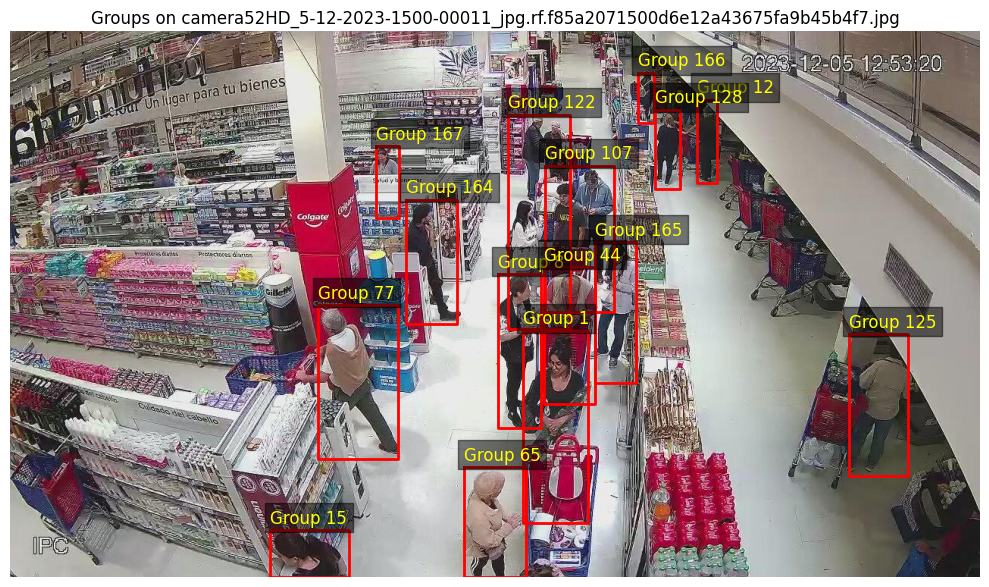

[✓] Showing image: camera52HD_5-12-2023-1500-00013_jpg.rf.a07893041d58abff3e6f4ecb26ec8d37.jpg


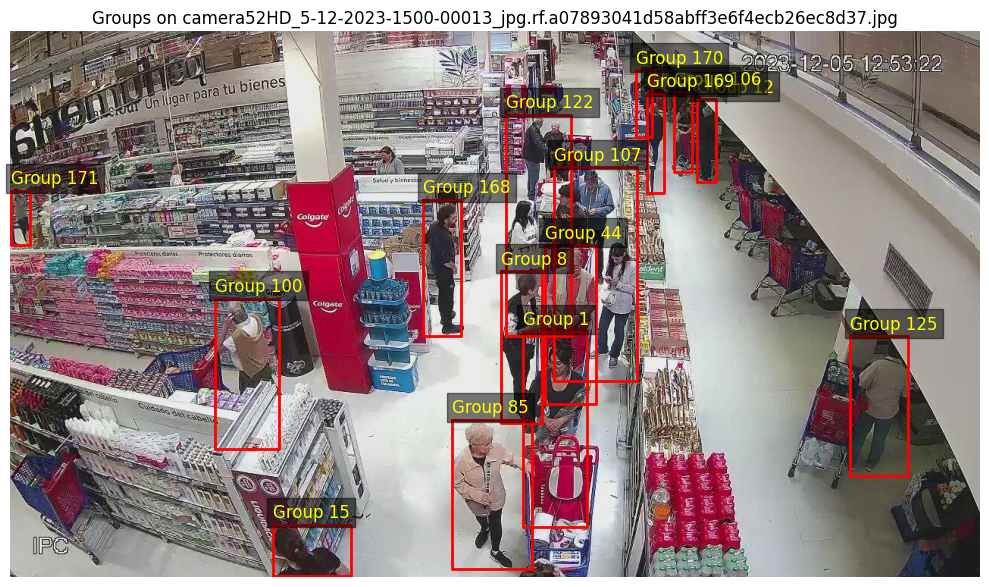

[✓] Showing image: camera52HD_5-12-2023-1500-00015_jpg.rf.b3a6011ba9bfbc74cd134289a9d94d8a.jpg


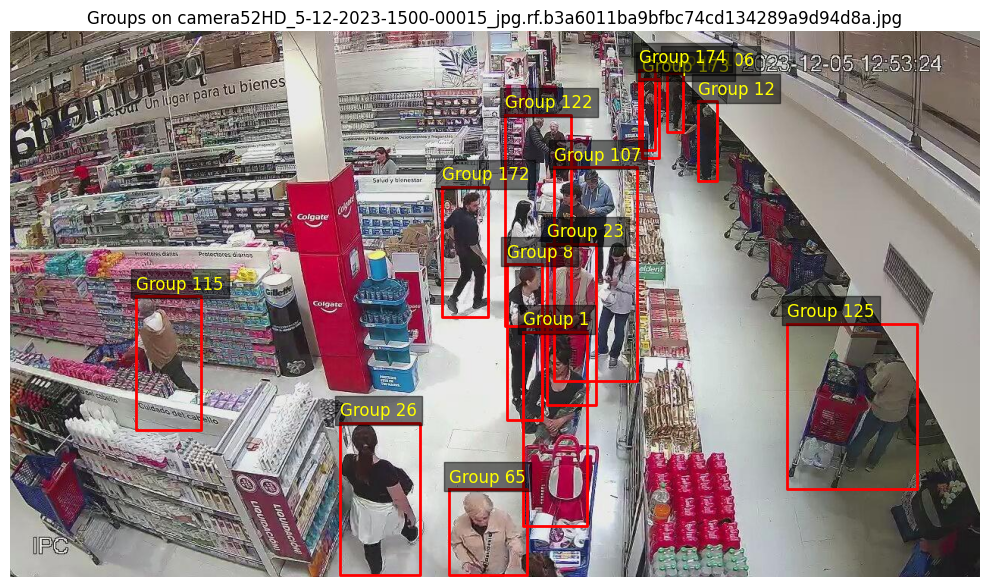

In [9]:
gdf = group_objects(gdf)
grouped_geoms = get_group_geometries(gdf)
show_groups_on_images(grouped_geoms, image_folder='camera52HD')

In [10]:
filtered_gdf = gdf[gdf['group'].isin([13, 8, 14])]
display(filtered_gdf)

,filename,class_id,x1,y1,x2,y2,center,geometry,square,group
20,camera52HD_5-12-2023-1500-00000_jpg.rf.578c816...,2,695,363,765,495,"(730.0, 429.0)","POLYGON ((695 363, 765 363, 765 495, 695 495, ...",9240.0,8.0
32,camera52HD_5-12-2023-1500-00001_jpg.rf.3902825...,2,676,530,778,720,"(727.0, 625.0)","POLYGON ((676 530, 778 530, 778 720, 676 720, ...",19380.0,13.0
34,camera52HD_5-12-2023-1500-00001_jpg.rf.3902825...,2,1,541,137,703,"(69.0, 622.0)","POLYGON ((1 541, 137 541, 137 703, 1 703, 1 541))",22032.0,14.0
156,camera52HD_5-12-2023-1500-00006_jpg.rf.b33a735...,1,641,317,697,520,"(669.0, 418.5)","POLYGON ((641 317, 697 317, 697 520, 641 520, ...",11368.0,8.0
184,camera52HD_5-12-2023-1500-00007_jpg.rf.7f582f1...,1,642,318,697,520,"(669.5, 419.0)","POLYGON ((642 318, 697 318, 697 520, 642 520, ...",11110.0,8.0
240,camera52HD_5-12-2023-1500-00010_jpg.rf.4c71ff8...,1,638,324,696,524,"(667.0, 424.0)","POLYGON ((638 324, 696 324, 696 524, 638 524, ...",11600.0,8.0
274,camera52HD_5-12-2023-1500-00011_jpg.rf.f85a207...,1,643,320,700,523,"(671.5, 421.5)","POLYGON ((643 320, 700 320, 700 523, 643 523, ...",11571.0,8.0
307,camera52HD_5-12-2023-1500-00013_jpg.rf.a078930...,1,648,316,702,516,"(675.0, 416.0)","POLYGON ((648 316, 702 316, 702 516, 648 516, ...",10800.0,8.0
345,camera52HD_5-12-2023-1500-00015_jpg.rf.b3a6011...,1,655,307,701,512,"(678.0, 409.5)","POLYGON ((655 307, 701 307, 701 512, 655 512, ...",9430.0,8.0


In [11]:
def count_groups_in_folder(folder_path, model, output_csv='predicted_group_counts.csv'):
    image_files = sorted(
        [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    )
    
    data = []
    for filename in image_files:
        image_path = os.path.join(folder_path, filename)
        img = cv2.imread(image_path)
        if img is None:
            print(f"[!] Не удалось загрузить: {filename}")
            continue

        result = model(img)[0]

        for box in result.boxes:
            cls_id = int(box.cls.item())
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            center = ((x1 + x2) / 2, (y1 + y2) / 2)
            poly = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
            data.append({
                'filename': filename,
                'class_id': cls_id,
                'x1': x1,
                'y1': y1,
                'x2': x2,
                'y2': y2,
                'center': center,
                'geometry': poly
            })

    if not data:
        print("Нет данных для анализа.")
        return

    df = pd.DataFrame(data)
    gdf = gpd.GeoDataFrame(df, geometry='geometry')
    gdf['square'] = gdf.geometry.area
    gdf = group_objects(gdf)  # Твоя функция группировки

    group_counts = gdf.dropna(subset=['group']).groupby('filename')['group'].nunique().reset_index()
    group_counts.columns = ['filename', 'group_count']
    group_counts.to_csv(output_csv, index=False)
    print(f"[✓] Сохранено в: {output_csv}")
    return group_counts

def compare_with_ground_truth(predicted_csv='predicted_group_counts.csv', true_csv='groups_count.csv'):
    pred_df = pd.read_csv(predicted_csv)
    true_df = pd.read_csv(true_csv)

    merged = pd.merge(true_df, pred_df, on='filename', how='outer', suffixes=('_true', '_predicted'))
    merged['difference'] = merged['group_count_predicted'] - merged['group_count_true']
    print("\n📋 Сравнение:")
    print(merged)

    mae = merged['difference'].abs().mean()
    print(f"\n📊 Средняя абсолютная ошибка (MAE): {mae:.2f}")
    return merged

# 📌 Запускаем анализ папки 'тест' и сравнение
group_counts_df = count_groups_in_folder('тест', model)
compare_with_ground_truth('predicted_group_counts.csv', 'groups_count.csv')


0: 384x640 14 persons, 8 trolleys, 115.1ms
Speed: 1.4ms preprocess, 115.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 persons, 10 trolleys, 90.2ms
Speed: 1.3ms preprocess, 90.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 11 trolleys, 81.4ms
Speed: 1.2ms preprocess, 81.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 9 trolleys, 81.7ms
Speed: 1.3ms preprocess, 81.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 8 trolleys, 77.5ms
Speed: 1.3ms preprocess, 77.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 6 trolleys, 79.0ms
Speed: 1.2ms preprocess, 79.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 6 trolleys, 80.8ms
Speed: 1.2ms preprocess, 80.8ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 p

,filename,group_count_true,group_count_predicted,difference
0,camera122HD-avi_20231206_195418-00024_jpg.rf.9...,12,19,7
1,camera122HD-avi_20231206_195418-00025_jpg.rf.f...,12,23,11
2,camera122HD-avi_20231206_214748-00000_jpg.rf.0...,10,22,12
3,camera122HD-avi_20231206_214748-00001_jpg.rf.2...,11,23,12
4,camera122HD-avi_20231206_214748-00002_jpg.rf.3...,10,20,10
...,...,...,...,...
99,camera71HD-avi_20231206_234435-00009_jpg.rf.df...,14,16,2
100,camera71HD-avi_20231206_234435-00010_jpg.rf.36...,14,15,1
101,camera71HD-avi_20231206_234435-00011_jpg.rf.2d...,15,16,1
102,camera71HD-avi_20231206_234435-00012_jpg.rf.f4...,16,21,5
